# **Copy Data From Drive**

In [ ]:
from google.colab import drive
drive._mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google_drive_downloader import GoogleDriveDownloader as gdd

In [ ]:
# needed libraries
import re
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import Flatten, Reshape, Dropout, BatchNormalization, Activation, LeakyReLU

# VGG16
from keras.applications.vgg16 import VGG16

# utilities
import os
from glob import glob
import matplotlib.pyplot as plt
import pathlib
import time
import datetime

from IPython import display
from tqdm.auto import tqdm

gpu_available = tf.config.list_physical_devices('GPU')
print(gpu_available)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
gdd.download_file_from_google_drive(file_id   = '1RnZ0OZ1UQlzQb6ibbmvZ6LsJe2PVhxjh',
                                    dest_path = 'data/train/raw890.rar')

gdd.download_file_from_google_drive(file_id   = '1cA-8CzajnVEL4feBRKdBxjEe6hwql6Z7',
                                    dest_path = 'data/train/reference890.rar')

gdd.download_file_from_google_drive(file_id   = '1Ew_r83nXzVk0hlkfuomWqsAIxuq6kaN4',
                                    dest_path = 'data/train/challenging890.rar')

In [ ]:
!mkdir data/train/raw -p
!unrar x -p1234567 data/train/raw890.rar data/train/
!unrar x -p8901234 data/train/reference890.rar data/train/
!unrar x -p5678901 data/train/challenging890.rar data/train/


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from data/train/raw890.rar

Creating    data/train/raw-890                                        OK
Extracting  data/train/raw-890/100_img_.png                                0%  OK 
Extracting  data/train/raw-890/10139.png                                   0%  OK 
Extracting  data/train/raw-890/10151.png                                   0%  OK 
Extracting  data/train/raw-890/101_img_.png                                0%  OK 
Extracting  data/train/raw-890/102_img_.png                                0%  OK 
Extracting  data/train/raw-890/104_img_.png                                0%  OK 
Extracting  data/train/raw-890/105_img_.png                                0%  OK 
Extracting  data/train/raw-890/106_img_.png                                0%  OK 
Extracting  data/train/raw-890/107_img_.png                                0%

In [ ]:
DATA_FOLDER = 'data/train/raw-890'
INPUT_DIM     = (256,256,3)

In [ ]:
filenames  = np.array(glob(os.path.join(DATA_FOLDER, '*.png')))
n_images        = filenames.shape[0]

train_size = int(0.8 * n_images)
test_size = n_images - train_size 

print('num image files : ', n_images)
print('train size : ', train_size)
print('test size : ', test_size)
print('total: ', train_size + test_size)

num image files :  890
train size :  712
test size :  178
total:  890


# Utilities to Preprocess Dataset


In [ ]:
import numpy as np
import cv2

# normalize an image  
def normalize(img):
  img = (img / 127.5) - 1
  return img

def dataAugmentation(img, n_crops=2):
  height, width, channels = img.shape
  crop_list = []

  for _ in range(n_crops):
    x, y = np.random.randint(0, 256-32, 2)
    rand_height, rand_width = 256, 256

    while rand_height + x >= 256 and rand_width + y >= 256: 
      rand_height, rand_width = np.random.randint(32, 160, 2)

    crop = img[y:y + rand_height, x:x + rand_width, :]
    crop = tf.image.resize(crop, (256, 256))
    crop = tf.expand_dims(crop, axis=0)
    crop_list.append(crop)

  return crop_list

# function to load the dataset, it receives an image path and returns the original image
# and the scracthed image 

def getUnpairedImages(raw_image_path, ref_image_path, u_image_path):

  #if flag == 1:
  #  ref_image_path = u_image_path

  # Read, decode and resize an image file to a uint8 tensor
  raw_image = tf.io.read_file(raw_image_path)
  raw_image = tf.image.decode_png(raw_image)
  raw_image = tf.image.resize(raw_image, (256, 256))

  ref_image = tf.io.read_file(ref_image_path)
  ref_image = tf.image.decode_png(ref_image)
  ref_image = tf.image.resize(ref_image, (256, 256))

  u_image = tf.io.read_file(u_image_path)
  u_image = tf.image.decode_png(u_image)
  u_image = tf.image.resize(u_image, (256, 256))

  # Convert both images to float32 tensors
  raw_image = tf.cast(tf.identity(raw_image), tf.float32)
  ref_image = tf.cast(tf.identity(ref_image), tf.float32)
  u_image = tf.cast(tf.identity(u_image), tf.float32)

  raw_image = normalize(raw_image)
  ref_image = normalize(ref_image)
  u_image = normalize(u_image)

  return [tf.expand_dims(raw_image, axis=0), tf.expand_dims(ref_image, axis=0), tf.expand_dims(u_image, axis=0)]


In [ ]:
def deNormalize(img):
  img = (img + 1)* 0.5
  return img

def getRange(img):
  return np.min(img), np.max(img)

# Build Dataset

A continuación tenemos el flujo de los datos para obtener cada uno de nuestros elementos del dataset. Inicialmente obtenemos los nombres de las imagenes y luego estos pasan a una función que se encarga de leer el archivo, reescalar la imagen y obtener una imagen con rayones aleatorios.

In [ ]:
RAW_DATA_FOLDER   = 'data/train/raw-890/'
REF_DATA_FOLDER   = 'data/train/reference-890/'

# get paths in dataset
RAW_PATH  = pathlib.Path(RAW_DATA_FOLDER)
REF_PATH  = pathlib.Path(REF_DATA_FOLDER)
raw_dataset = tf.data.Dataset.list_files(str(RAW_PATH / '*.png'), shuffle=False)
ref_dataset = tf.data.Dataset.list_files(str(REF_PATH / '*.png'), shuffle=False)
unpair_dataset = tf.data.Dataset.list_files(str(REF_PATH / '*.png'), shuffle=True)

dataset = tf.data.Dataset.zip((raw_dataset, ref_dataset, unpair_dataset))
dataset = dataset.shuffle(100)

In [ ]:
tmp = list(dataset.take(100))

In [ ]:
[tmp[i][0] for i in range(100)]

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

# get train and test dataset
train_ds = dataset.take(train_size)
test_ds = dataset.skip(train_size)

# add layer to read original and scratched image
train_ds = train_ds.map(lambda x, y, z: tf.numpy_function(func=getUnpairedImages, inp=[x, y, z], Tout=((tf.float32, tf.float32, tf.float32))), num_parallel_calls=AUTOTUNE)
test_ds = test_ds.map(lambda x, y, z: tf.numpy_function(func=getUnpairedImages, inp=[x, y, z], Tout=(tf.float32, tf.float32, tf.float32)), num_parallel_calls=AUTOTUNE)

<h2> Visualize Images From Dataset </h2>

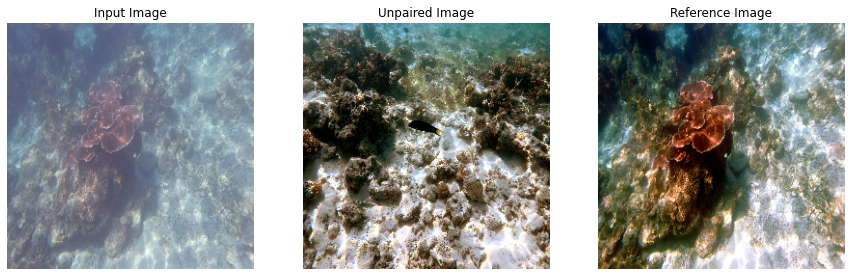

In [ ]:
# try dataset
datatmp = train_ds.take(10)
data = list(datatmp)
inp, tar = data[0][0], data[0][1]

plt.figure(figsize=(15, 15))
display_list = [(data[i][0][0], data[i][2][0], data[i][1][0]) for i in range(10)]
title = ['Input Image', 'Unpaired Image', 'Reference Image']

for j in range(1):
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[j][i]* 0.5 + 0.5)
    plt.axis('off')
  plt.show()

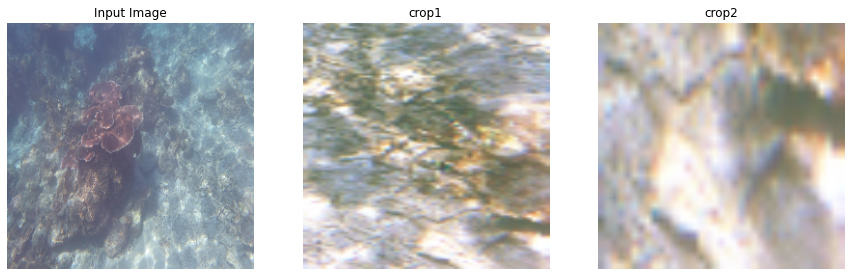

In [ ]:
inp_crops = dataAugmentation(tar[0], 2)
plt.figure(figsize=(15, 15))
display_list = [inp[0], inp_crops[0][0], inp_crops[1][0]]
title = ['Input Image', 'crop1', 'crop2']
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i]* 0.5 + 0.5)
    plt.axis('off')
plt.show()

# Network Architecture

In [ ]:
OUTPUT_CHANNELS = 3

<h2> Encoder </h2>

Nuestro encoder es una capa convolucional seguida de una capa de Batch Normalization y finalmente una capa de LeakyReLU. 

In [ ]:
def downsample(filters, size, apply_batchnorm=True, strides=2, padding='same', activation='LeakyReLU'):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=strides, padding=padding,
                             use_bias=True))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  if activation == 'ReLU':
    result.add(tf.keras.layers.ReLU())
  elif activation == 'LeakyReLU':
    result.add(tf.keras.layers.LeakyReLU())

  return result

<h2> Decoder </h2>

El decoder por otro lado está compuesto por una capa de deconvolución seguido por una capa de dropout y finalmente una capa de activación de LeakyReLU

In [ ]:
def upsample(filters, size, strides=2, padding='same', use_activation=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=strides,
                                    padding=padding,
                                    use_bias=True))

  result.add(tf.keras.layers.BatchNormalization())
  
  if use_activation:
    result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
def resisudal_block(filters, size):
  result = tf.keras.Sequential()
  result.add(downsample(filters, size, strides=1, activation='ReLU'))
  result.add(downsample(filters, size, strides=1, activation='None'))

  return result

<h2> Generator </h2>

El generador consiste básicamente en varias capas para encodificar los datos y hacer una reducción de dimensiones y luego proceder de manera inversa con varias capas de decodificadores. Cada capa de encoder se encuentra conectada a una capa del decodificador al estilo de una red residual.

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(32, 7, strides=1, activation='ReLU'),   # (batch_size, 256, 256, 32)
    downsample(64, 3, activation='ReLU'),              # (batch_size, 128, 128, 64)
    downsample(128, 3, activation='ReLU'),             # (batch_size, 64, 64, 128)
  ]

  res_blocks = [
    resisudal_block(128, 3),        # (batch_size, 64, 64, 128)
    resisudal_block(128, 3),        # (batch_size, 64, 64, 128)
    resisudal_block(128, 3),        # (batch_size, 64, 64, 128)
    resisudal_block(128, 3),        # (batch_size, 64, 64, 128)
    resisudal_block(128, 3),        # (batch_size, 64, 64, 128)
    resisudal_block(128, 3)         # (batch_size, 64, 64, 128)
  ]

  up_stack = [
    upsample(64, 3, strides=2, padding='same'),        # (batch_size, 128, 128, 64)
    upsample(32, 3, strides=2, padding='same'),        # (batch_size, 256, 256, 32)
    downsample(3, 7, strides=1, activation='None'),    # (batch_size, 256, 256, 3)
  ]

  last = tf.keras.layers.Activation(tf.keras.activations.tanh)
  x = inputs

  # Downsampling through the model
  for down in down_stack:
    x = down(x)
  
  # residual blocks
  for res_block in res_blocks:
    x = keras.layers.Add()([x, res_block(x)])

  # Upsampling and establishing the skip connections
  for up in up_stack:
    x = up(x)

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

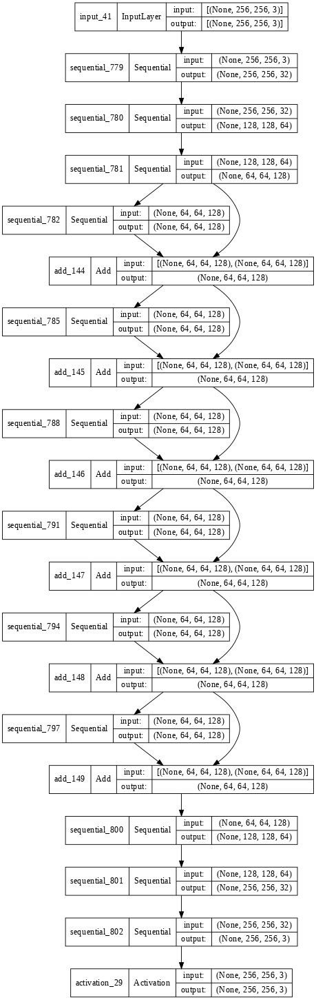

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

(-1.0, 1.0)


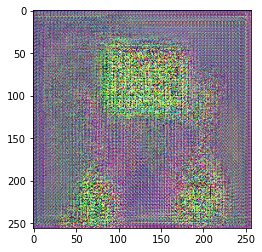

In [ ]:
gen_output = generator(inp, training=True)
print(getRange(gen_output))
img_out = deNormalize(gen_output[0])
plt.imshow(img_out)

In [ ]:
#loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
loss_object = tf.keras.losses.MeanSquaredError()
l1_loss = keras.losses.MeanAbsoluteError()

In [ ]:
def generator_loss(disc_generated_output):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  #l1_loss = tf.reduce_mean(tf.abs(real_img - gen_output))

  #total_gen_loss = gan_loss + (GEN_LAMBDA * l1_loss)

  return gan_loss

<h2> Discriminator </h2>

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  #tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  #x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 128, 128, channels*2)

  down1 = downsample(64, 4, False)(inp)   # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)       # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)       # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=True)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp], outputs=last)

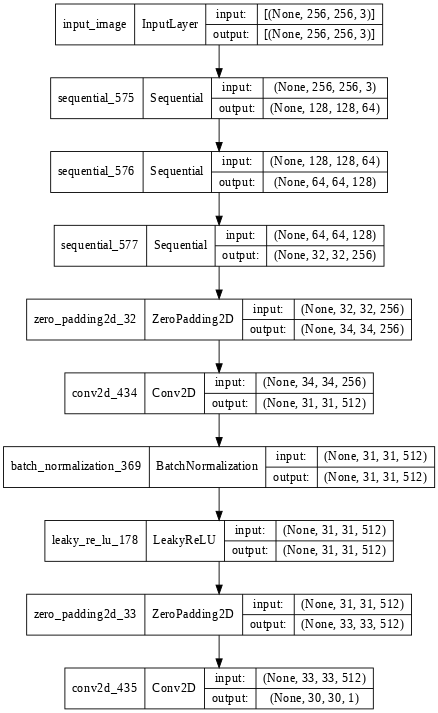

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

(-5.9756565, 7.066409)


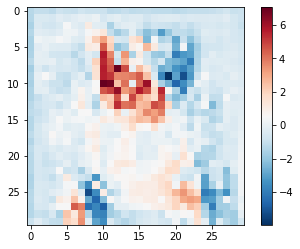

In [ ]:
disc_out = discriminator([inp], training=True)
print(getRange(disc_out))
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

# Cycle Consistency Loss

In [ ]:
def cycle_loss(F_G_x, G_F_y, x, y):
  loss_x = l1_loss(F_G_x, x)
  loss_y = l1_loss(G_F_y, y)

  return loss_x + loss_y


# VGG16 Features Extractor

In [ ]:
vgg16 = VGG16()

553476096/553467096 [==============================] - 8s 0us/step


In [ ]:
vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
def getFeaturesExtractor():
  input = keras.layers.Input([256, 256, 3])

  x = keras.layers.Resizing(
    224, 224, interpolation="bilinear", crop_to_aspect_ratio=False, name='resize')(input)

  for layer in vgg16.layers:
    layer.trainable = False
  
  for layer in vgg16.layers[1:]:
    x = layer(x)

    if layer.name == 'block2_pool':
      print('getting pool in block2')
      block2 = x
    
    if layer.name == 'block5_pool':
      block5 = x
      break
  
  FB2 = keras.Model(inputs=input, outputs=block2)
  FB5 = keras.Model(inputs=input, outputs=block5)

  return FB2, FB5

# Perceptual Loss

In [ ]:
def get_perceptual_loss(feat_real_img, feat_decoded_img):
  return loss_object(feat_real_img, feat_decoded_img) 

# Build Model

In [ ]:
genG = Generator()
genF = Generator()
discX = Discriminator()
discY = Discriminator()
FeatBlock2, FeatBlock5 = getFeaturesExtractor()

getting pool in block2


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
final_file = '/content/drive/MyDrive/Colab_Notebooks/ML2/Tareas/Tarea4/weights_no_init_augmentation_50Cyc'

final_checkpoint = tf.train.Checkpoint(genG=genG,
                                       genF=genF,
                                       discX=discX,
                                       discY=discY)


# Load Model If necessary

In [ ]:
final_checkpoint.read(final_file).assert_consumed()

# Generate Images

For image generation we use the trained $G$ generator to obtain dehazed underwater images. To obtain high resolution images we use the laplacian pyramid upscaling process.   

In [ ]:
def get_gaussian_pyramid(img):
  gauss_pyramid = [img]
  height, width, channels = img.shape

  while height > 8:
    height //= 2
    width //= 2
    img = cv2.pyrDown(img, dstsize=(height, width))
    gauss_pyramid.append(img)
  
  return gauss_pyramid


In [ ]:
def LaplacianUpscaling(dehaze_image, hr_hazed_image, wg_Ik=1.0, wg_gauss=0.0):
  deh_gauss_pyr = get_gaussian_pyramid(dehaze_image)
  hr_srcImg_pyr = get_gaussian_pyramid(hr_hazed_image)
  laplacian_pyr = []

  # compute laplacian pyramid
  for i in range(len(hr_srcImg_pyr) - 1):
    height, width, channels = hr_srcImg_pyr[i].shape
    laplacian_pyr.append(hr_srcImg_pyr[i] - cv2.pyrUp(hr_srcImg_pyr[i+1], dstsize=(height, width)))
  
  Ik = deh_gauss_pyr[-1]
  
  height_dest, width_dest, channels_dest = Ik.shape
  
  # upscale image
  while height_dest < 256:
    height_dest *= 2
    width_dest *= 2
    Ik = cv2.pyrUp(wg_Ik * Ik + wg_gauss * deh_gauss_pyr[-1], dstsize=(height_dest, width_dest)) + laplacian_pyr[-1]
    laplacian_pyr.pop(-1)
    deh_gauss_pyr.pop(-1)
  
  return Ik


In [ ]:
def generate_images(model, test_input, tar, lap_up=True, wg_Ik=1.0, wg_gauss=0.0):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))
  
  hr_img = LaplacianUpscaling(prediction[0].numpy(), test_input[0].numpy(), wg_Ik, wg_gauss) if lap_up else prediction[0]

  display_list = [test_input[0], hr_img, tar[0]]
  title = ['Input Image', 'Predicted Image', 'Reference Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i]* 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


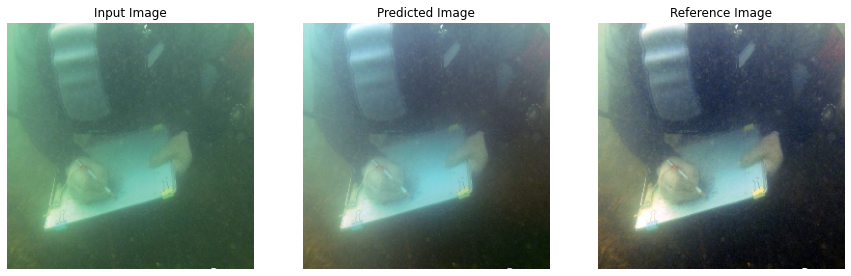

In [ ]:
for example_input, example_target, _ in test_ds.take(1):
  generate_images(genG, example_input, example_target)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


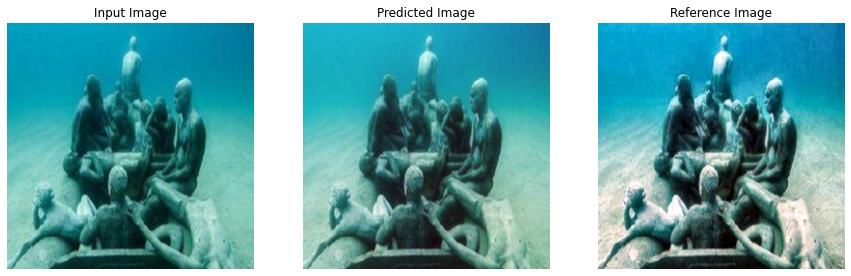

In [ ]:
for example_input, example_target, _ in test_ds.take(1):
  generate_images(genG, example_input, example_target)

# Train

In [ ]:
log_dir="/content/drive/MyDrive/Colab_Notebooks/ML2/Tareas/Tarea4/logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
LAMBDA = 0.0001

In [ ]:
@tf.function
def generator_train_step(input_image, u_image, step):
  with tf.GradientTape() as genG_tape, tf.GradientTape() as genF_tape:

    # used for both optimization rounds
    G_x = genG(input_image, training=True)
    F_y = genF(u_image, training=True)

    D_F_y = discX(F_y, training=True)
    D_G_x = discY(G_x, training=True)

    F_G_x = genF(G_x, training=True)
    G_F_y = genG(F_y, training=True)
    # cycle loss
    cyc_loss = cycle_loss(F_G_x, G_F_y, input_image, u_image)
    # perceptual loss
    perc_loss = get_perceptual_loss(FeatBlock2(input_image), FeatBlock2(F_G_x)) \
                + get_perceptual_loss(FeatBlock5(input_image), FeatBlock5(F_G_x))\
                + get_perceptual_loss(FeatBlock2(u_image), FeatBlock2(G_F_y))\
                + get_perceptual_loss(FeatBlock5(u_image), FeatBlock5(G_F_y)) 
    # generator loss
    genG_loss = generator_loss(D_G_x)
    genF_loss = generator_loss(D_F_y)

    genG_total_loss = genG_loss + 10 * cyc_loss + LAMBDA * perc_loss
    genF_total_loss = genF_loss + 10 * cyc_loss + LAMBDA * perc_loss

  genG_grads = genG_tape.gradient(genG_total_loss, genG.trainable_variables)
  genF_grads = genF_tape.gradient(genF_total_loss, genF.trainable_variables)
  
  generator_optimizer.apply_gradients(zip(genG_grads, genG.trainable_variables))
  generator_optimizer.apply_gradients(zip(genF_grads, genF.trainable_variables))
  
  return genG_total_loss, genF_total_loss

In [ ]:
@tf.function
def disc_train_step(input_image, u_image, step):
  with tf.GradientTape() as discX_tape, tf.GradientTape() as discY_tape:

    # used for both optimization rounds
    G_x = genG(input_image, training=True)
    F_y = genF(u_image, training=True)

    D_F_y = discX(F_y, training=True)
    D_G_x = discY(G_x, training=True)

    D_x = discX(input_image, training=True)
    D_y = discY(u_image, training=True)
    # discriminator loss
    discX_loss = discriminator_loss(D_x, D_F_y)
    discY_loss = discriminator_loss(D_y, D_G_x)

  discX_grads = discX_tape.gradient(discX_loss, discX.trainable_variables)
  discY_grads = discY_tape.gradient(discY_loss, discY.trainable_variables)
  discriminator_optimizer.apply_gradients(zip(discX_grads, discX.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discY_grads, discY.trainable_variables))

  return discX_loss, discY_loss

In [ ]:
def fit(train_ds, test_ds, epochs, initial_epoch=0):
  example_input, example_target, _ = next(iter(test_ds.take(1)))

  for epoch in range(initial_epoch, initial_epoch + epochs):
    print('Epoch: ', epoch)
    
    turn = epoch % 2
    genG_losses = []
    genF_losses = []
    discX_losses = []
    discY_losses = []

    if turn == 0:
      generate_images(genG, example_input, example_target)
    
    for step, (input_image, _, u_image) in tqdm(train_ds.enumerate()):
      inputs = dataAugmentation(input_image[0])
      targetSpace = dataAugmentation(u_image[0])
      inputs.append(input_image)
      targetSpace.append(u_image)

      for (input_image, u_image) in zip(inputs, targetSpace):

        if turn == 1:
          genG_loss, genF_loss = generator_train_step(input_image, u_image, step)
          genG_losses.append(genG_loss)
          genF_losses.append(genF_loss)
        else:
          discX_loss, discY_loss = disc_train_step(input_image, u_image, step)
          discX_losses.append(discX_loss)
          discY_losses.append(discY_loss)

    if turn == 1:
      print('genG losses:', genG_losses)
      print('genF losses:', genF_losses)
      genG_mean_loss = tf.math.reduce_mean(genG_losses)
      genF_mean_loss = tf.math.reduce_mean(genF_losses)
      print('genG_mean_loss: {:.6f}, genF_mean_loss: {:.6f}'.format(genG_mean_loss, genF_mean_loss))
    else:
      print('discX losses:', discX_losses)
      print('discY losses:', discY_losses)
      discX_mean_loss = tf.math.reduce_mean(discX_losses)
      discY_mean_loss = tf.math.reduce_mean(discY_losses)
      print('discX_mean_loss: {:.6f}, discY_mean_loss: {:.6f}'.format(discX_mean_loss, discY_mean_loss))

    final_checkpoint.write(final_file)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  0


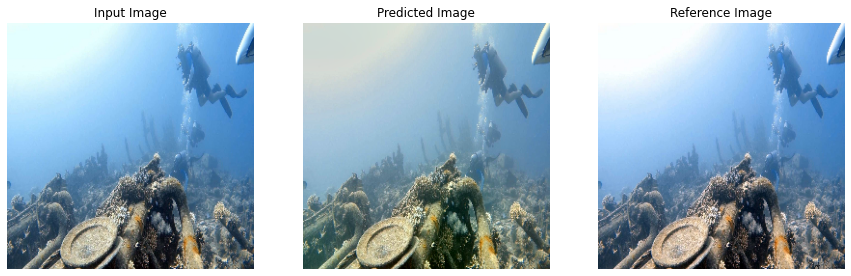

  0%|          | 0/712 [00:00<?, ?it/s]

discX losses: [<tf.Tensor: shape=(), dtype=float32, numpy=1.0379782>, <tf.Tensor: shape=(), dtype=float32, numpy=0.48630705>, <tf.Tensor: shape=(), dtype=float32, numpy=0.34774357>, <tf.Tensor: shape=(), dtype=float32, numpy=0.25586858>, <tf.Tensor: shape=(), dtype=float32, numpy=0.1833116>, <tf.Tensor: shape=(), dtype=float32, numpy=0.16891052>, <tf.Tensor: shape=(), dtype=float32, numpy=0.088400915>, <tf.Tensor: shape=(), dtype=float32, numpy=0.15375009>, <tf.Tensor: shape=(), dtype=float32, numpy=0.22231501>, <tf.Tensor: shape=(), dtype=float32, numpy=0.121912174>, <tf.Tensor: shape=(), dtype=float32, numpy=0.12914819>, <tf.Tensor: shape=(), dtype=float32, numpy=0.085648246>, <tf.Tensor: shape=(), dtype=float32, numpy=0.026669648>, <tf.Tensor: shape=(), dtype=float32, numpy=0.038238477>, <tf.Tensor: shape=(), dtype=float32, numpy=0.033711627>, <tf.Tensor: shape=(), dtype=float32, numpy=0.016029835>, <tf.Tensor: shape=(), dtype=float32, numpy=0.012154032>, <tf.Tensor: shape=(), dtype

  0%|          | 0/712 [00:00<?, ?it/s]

genG losses: [<tf.Tensor: shape=(), dtype=float32, numpy=2.0833986>, <tf.Tensor: shape=(), dtype=float32, numpy=2.4013512>, <tf.Tensor: shape=(), dtype=float32, numpy=3.0125716>, <tf.Tensor: shape=(), dtype=float32, numpy=2.4112523>, <tf.Tensor: shape=(), dtype=float32, numpy=2.5688465>, <tf.Tensor: shape=(), dtype=float32, numpy=2.0557587>, <tf.Tensor: shape=(), dtype=float32, numpy=2.3054566>, <tf.Tensor: shape=(), dtype=float32, numpy=3.0442457>, <tf.Tensor: shape=(), dtype=float32, numpy=2.314091>, <tf.Tensor: shape=(), dtype=float32, numpy=2.2695558>, <tf.Tensor: shape=(), dtype=float32, numpy=2.8561792>, <tf.Tensor: shape=(), dtype=float32, numpy=2.3034267>, <tf.Tensor: shape=(), dtype=float32, numpy=2.7533858>, <tf.Tensor: shape=(), dtype=float32, numpy=2.7274327>, <tf.Tensor: shape=(), dtype=float32, numpy=3.3224962>, <tf.Tensor: shape=(), dtype=float32, numpy=4.440769>, <tf.Tensor: shape=(), dtype=float32, numpy=3.2855859>, <tf.Tensor: shape=(), dtype=float32, numpy=2.5730147>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:  2


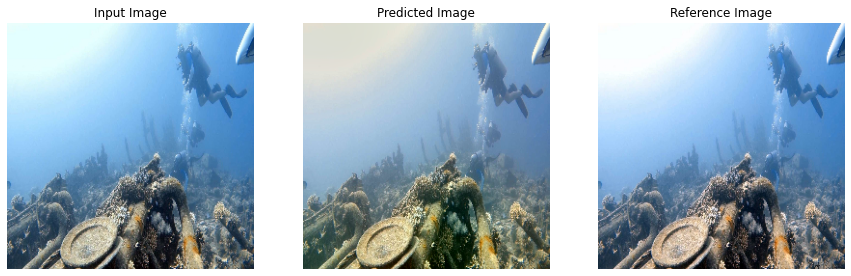

  0%|          | 0/712 [00:00<?, ?it/s]

discX losses: [<tf.Tensor: shape=(), dtype=float32, numpy=0.97657835>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5954043>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4228378>, <tf.Tensor: shape=(), dtype=float32, numpy=0.33122805>, <tf.Tensor: shape=(), dtype=float32, numpy=0.27673757>, <tf.Tensor: shape=(), dtype=float32, numpy=0.24715368>, <tf.Tensor: shape=(), dtype=float32, numpy=0.12216948>, <tf.Tensor: shape=(), dtype=float32, numpy=0.062398933>, <tf.Tensor: shape=(), dtype=float32, numpy=0.16337323>, <tf.Tensor: shape=(), dtype=float32, numpy=0.031428277>, <tf.Tensor: shape=(), dtype=float32, numpy=0.06077254>, <tf.Tensor: shape=(), dtype=float32, numpy=0.042064235>, <tf.Tensor: shape=(), dtype=float32, numpy=0.022078633>, <tf.Tensor: shape=(), dtype=float32, numpy=0.016629513>, <tf.Tensor: shape=(), dtype=float32, numpy=0.051840216>, <tf.Tensor: shape=(), dtype=float32, numpy=0.062142275>, <tf.Tensor: shape=(), dtype=float32, numpy=0.034787454>, <tf.Tensor: shape=(), dtype

  0%|          | 0/712 [00:00<?, ?it/s]

genG losses: [<tf.Tensor: shape=(), dtype=float32, numpy=2.5632527>, <tf.Tensor: shape=(), dtype=float32, numpy=2.927639>, <tf.Tensor: shape=(), dtype=float32, numpy=2.6436968>, <tf.Tensor: shape=(), dtype=float32, numpy=3.5025854>, <tf.Tensor: shape=(), dtype=float32, numpy=2.9025726>, <tf.Tensor: shape=(), dtype=float32, numpy=2.6388876>, <tf.Tensor: shape=(), dtype=float32, numpy=2.7709303>, <tf.Tensor: shape=(), dtype=float32, numpy=2.6975498>, <tf.Tensor: shape=(), dtype=float32, numpy=2.8764312>, <tf.Tensor: shape=(), dtype=float32, numpy=2.603369>, <tf.Tensor: shape=(), dtype=float32, numpy=3.568329>, <tf.Tensor: shape=(), dtype=float32, numpy=2.7762423>, <tf.Tensor: shape=(), dtype=float32, numpy=3.256027>, <tf.Tensor: shape=(), dtype=float32, numpy=2.9121509>, <tf.Tensor: shape=(), dtype=float32, numpy=2.397537>, <tf.Tensor: shape=(), dtype=float32, numpy=2.1821523>, <tf.Tensor: shape=(), dtype=float32, numpy=3.0687485>, <tf.Tensor: shape=(), dtype=float32, numpy=2.062904>, <t

In [53]:
fit(train_ds, test_ds, epochs=4, initial_epoch=0)

In [ ]:
img_list = list(test_ds.take(10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


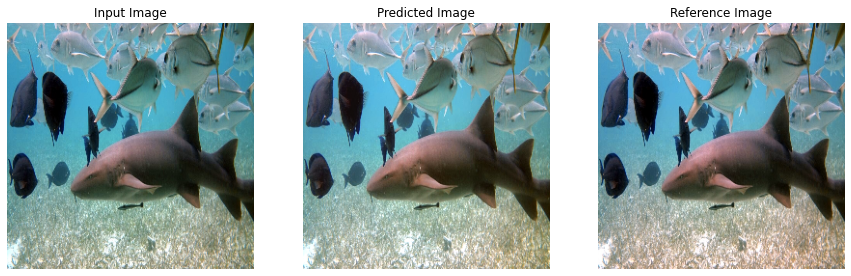

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


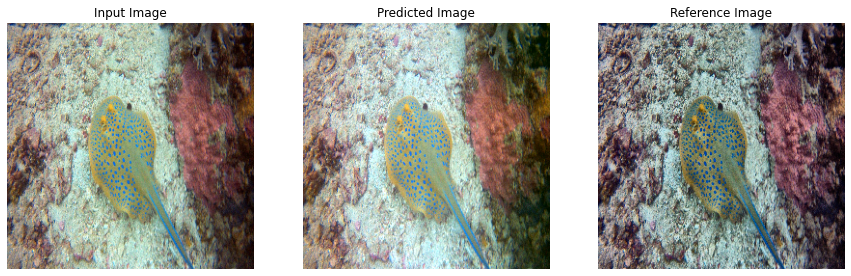

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


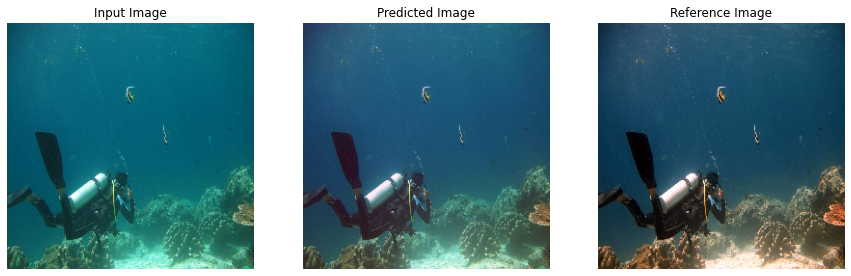

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


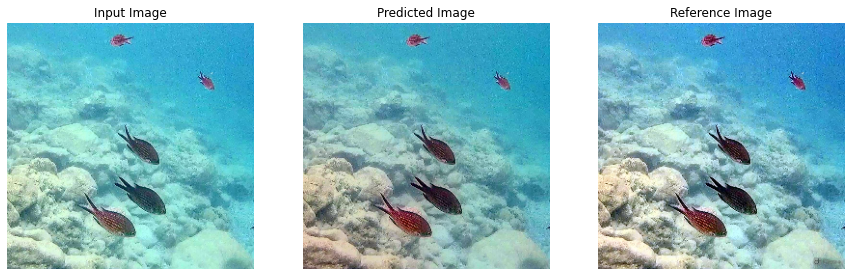

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


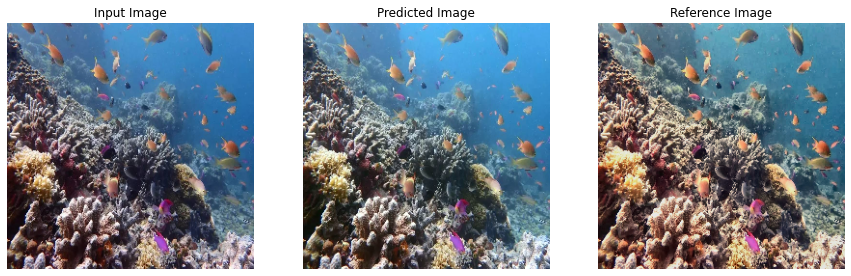

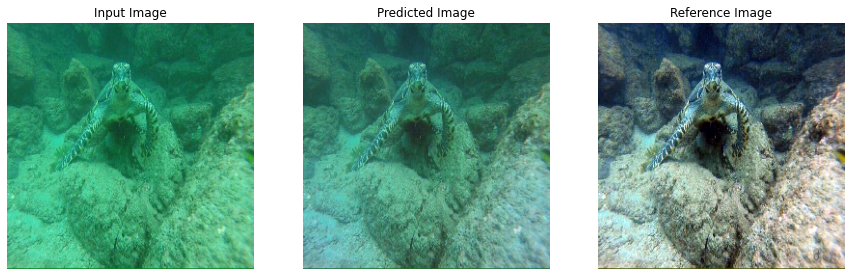

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


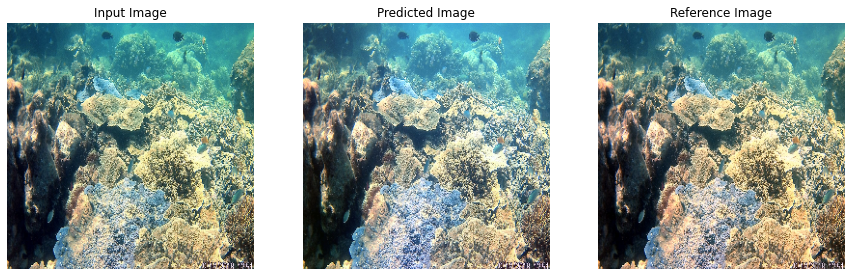

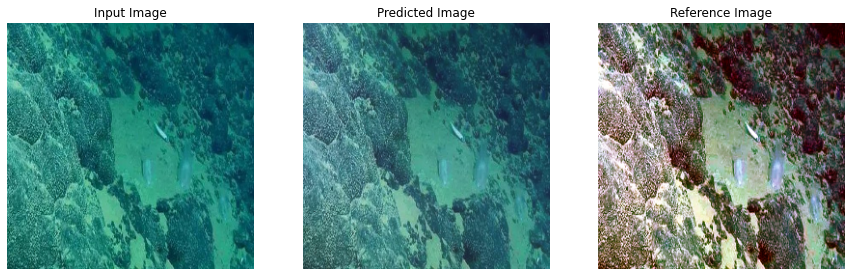

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


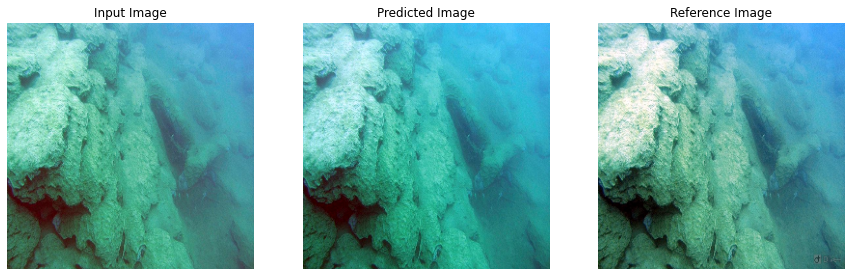

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


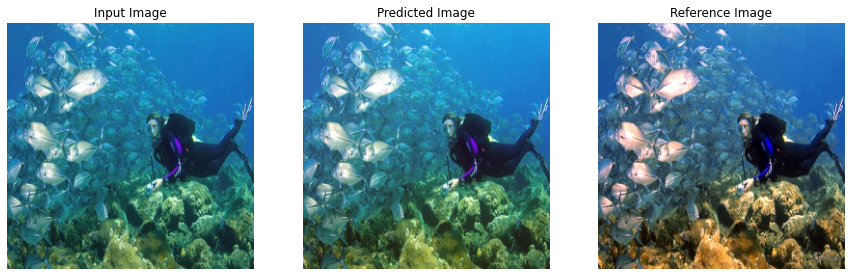

In [54]:
for img_pair in img_list:
  img, ref, uimg = img_pair
  generate_images(genG, img, ref, lap_up=True)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6
5


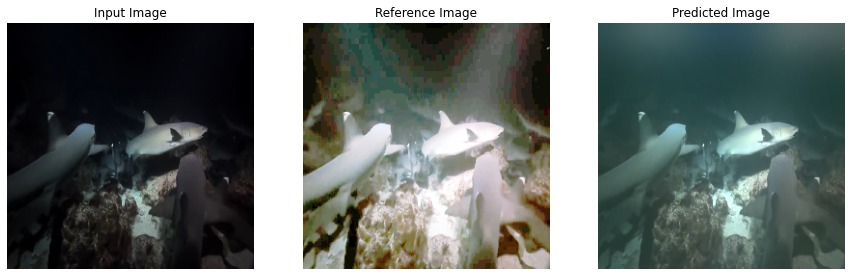

In [ ]:
img, ref, uimg = list(train_ds.take(1))[0]
generate_images(genG, img, ref)

# Save Final Checkpoint

In [ ]:
final_path = final_checkpoint.write(final_file)
print(final_path)

/content/drive/MyDrive/Colab_Notebooks/ML2/Tareas/Tarea4/weights
